In [1]:
import os
import torch
import numpy as np
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow import keras
from torchvision.utils import save_image 
import torch
import torch.nn.functional as F
import math


In [2]:
target_size = (64, 64)
image_directory = r'yes/'
image_files = os.listdir(image_directory)
preprocessed_images = []

In [3]:
for i, image_file in enumerate(image_files):
    if i >= 4 * 8:
        break  # Preprocess up to 4x8 images
    image_path = os.path.join(image_directory, image_file)
    img = Image.open(image_path)
    # Resize the images
    img = img.resize(target_size)
    # Convert the images to grayscale
    img = img.convert('L')
    # Normalize the pixel values
    img = np.array(img) / 255.0
    preprocessed_images.append(img)

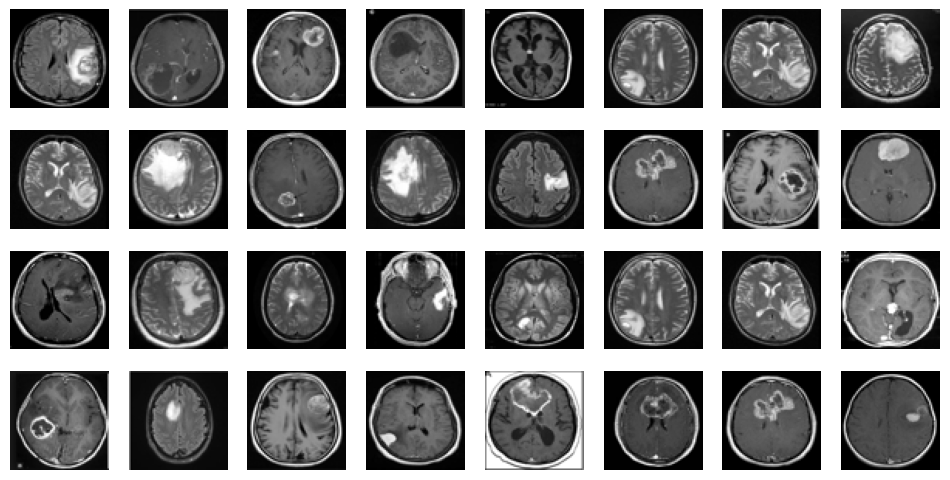

In [4]:
# Display the preprocessed images
fig, axes = plt.subplots(4, 8, figsize=(12, 6))
for i, img in enumerate(preprocessed_images):
    ax = axes[i // 8, i % 8]
    ax.imshow(img, cmap='gray')
    ax.axis('off')
plt.show()

In [5]:
# Preprocess the images and extract labels
preprocessed_images = []
labels = []

for i, image_file in enumerate(image_files):
    if i >= 4 * 8:
        break  # Preprocess up to 4x8 images
    image_path = os.path.join(image_directory, image_file)
    img = Image.open(image_path)

    # Resize the images
    img = img.resize(target_size)

    # Convert the images to grayscale
    img = img.convert('L')

    # Normalize the pixel values
    img = np.array(img) / 255.0

    preprocessed_images.append(img)
    
    # Assign labels appropriately here
    # For example, you could have a label array corresponding to each image
    label = 1 if 'positive' in image_file else 0  # Replace with your own labeling logic
    labels.append(label)

In [6]:
# Convert the lists to numpy arrays
preprocessed_images = np.array(preprocessed_images)
labels = np.array(labels)

In [7]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

TRAIN THE GAN MODEL

Generator

In [8]:
class Generator(nn.Module):
    def __init__(self, latent_dim, out_channels, img_size):
        super(Generator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(128, img_size * img_size),
            nn.Tanh()
        )
        self.out_channels = out_channels
        self.img_size = img_size

    def forward(self, z):
        img = self.model(z)
        img = img.view(img.size(0), self.out_channels, self.img_size, self.img_size)
        return img

Discriminator

In [9]:
class Discriminator(nn.Module):
    def __init__(self, in_channels, img_size):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(in_channels * img_size * img_size, 128),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(128, 1),
            nn.Sigmoid()
        )

    def forward(self, img):
        flattened = img.view(img.size(0), -1)
        validity = self.model(flattened)
        return validity

In [10]:
real_imgs = torch.tensor(preprocessed_images, dtype=torch.float32).to(device)  # Convert preprocessed images to torch tensor and move them to the GPU if available

The variables

In [11]:
latent_dim = 100
lr = 0.0002
b1 = 0.5
b2 = 0.999
#batch_size = 64
batch_size = real_imgs.size(0)  # Get the batch size from real images tensor
valid = torch.ones(batch_size, 1).to(device)  # Create tensor of ones with the batch size
fake = torch.zeros(batch_size, 1).to(device)  # Create tensor of zeros with the batch size
n_epochs = 200000
sample_interval = 400
img_size = 64
channels = 1  # Grayscale

In [12]:
generator = Generator(latent_dim, channels, img_size)
discriminator = Discriminator(channels, img_size)

In [13]:
criterion = nn.BCELoss()

In [14]:
optimizer_G = torch.optim.Adam(generator.parameters(), lr=lr, betas=(b1, b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(b1, b2))

In [15]:
os.makedirs("generatedimages", exist_ok=True)

gaussian 

In [16]:
def gaussian_kernel(size: int = 3, channels: int = 1, sigma: float = 1.0):
    # Create a 1D Gaussian kernel
    x_coords = torch.arange(size) - size // 2
    x_grid = x_coords.repeat(size).view(size, size)
    y_grid = x_grid.t()
    xy_grid = torch.stack([x_grid, y_grid], dim=-1).float()
    
    mean = torch.zeros(2)
    variance = torch.ones(2) * sigma
    
    gaussian_kernel = (1 / (2 * math.pi * sigma ** 2)) * \
                      torch.exp(
                          -torch.sum((xy_grid - mean) ** 2.0, dim=-1) / (2 * sigma ** 2)
                      )
    
    # Normalize the kernel
    gaussian_kernel = gaussian_kernel / torch.sum(gaussian_kernel)
    
    # Extend to desired number of channels
    gaussian_kernel = gaussian_kernel.view(1, 1, size, size)
    gaussian_kernel = gaussian_kernel.repeat(channels, 1, 1, 1)
    
    return gaussian_kernel

def apply_smoothing(image: torch.Tensor):
    channels = image.shape[1]  # Assuming [batch_size, channels, height, width]
    kernel = gaussian_kernel(size=3, channels=channels)
    return F.conv2d(image, weight=kernel, groups=channels, padding=1)


In [17]:
# After generating images
z = torch.randn(25, latent_dim)  # Generate 25 random noise vectors
generated_imgs = generator(z).cpu()
smoothed_imgs = apply_smoothing(generated_imgs)

In [18]:
image_counter = 0 
# Transformation to resize images to 256x256
resize_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

In [19]:
for epoch in range(n_epochs):

    # Adversarial ground truths
    valid = torch.ones(batch_size, 1)
    fake = torch.zeros(batch_size, 1)

    # Train Generator
    optimizer_G.zero_grad()
    z = torch.randn(batch_size, latent_dim)
    generated_imgs = generator(z)
    g_loss = criterion(discriminator(generated_imgs), valid)
    g_loss.backward()
    optimizer_G.step()

    # Train Discriminator
    optimizer_D.zero_grad()
    real_imgs = torch.tensor(preprocessed_images, dtype=torch.float32)  # Convert preprocessed images to torch tensor
    real_loss = criterion(discriminator(real_imgs), valid)
    fake_loss = criterion(discriminator(generated_imgs.detach()), fake)
    d_loss = (real_loss + fake_loss) / 2
    d_loss.backward()
    optimizer_D.step()
    # Clamp and smooth the generated images
    generated_imgs = generated_imgs.clamp(0, 1)
    smoothed_imgs = apply_smoothing(generated_imgs)

    print("[Epoch %d/%d] [D loss: %f] [G loss: %f]" % (epoch, n_epochs, d_loss.item(), g_loss.item()))

    # Save generated image samples (now smoothed)
    if epoch % sample_interval == 0:
        for i, image in enumerate(smoothed_imgs.data):
            # Generate a unique filename for each image
            filename = f"generatedimages/{epoch}_{image_counter}.png"
            save_image(image, filename, normalize=True)
            image_counter += 1

[Epoch 0/200000] [D loss: 0.686445] [G loss: 0.639725]
[Epoch 1/200000] [D loss: 0.541154] [G loss: 0.655761]
[Epoch 2/200000] [D loss: 0.451307] [G loss: 0.689904]
[Epoch 3/200000] [D loss: 0.389966] [G loss: 0.739164]
[Epoch 4/200000] [D loss: 0.343116] [G loss: 0.802404]
[Epoch 5/200000] [D loss: 0.305629] [G loss: 0.872936]
[Epoch 6/200000] [D loss: 0.283339] [G loss: 0.918898]
[Epoch 7/200000] [D loss: 0.255463] [G loss: 0.995456]
[Epoch 8/200000] [D loss: 0.226202] [G loss: 1.093926]
[Epoch 9/200000] [D loss: 0.225475] [G loss: 1.087153]
[Epoch 10/200000] [D loss: 0.209336] [G loss: 1.147331]
[Epoch 11/200000] [D loss: 0.194604] [G loss: 1.210685]
[Epoch 12/200000] [D loss: 0.189251] [G loss: 1.230124]
[Epoch 13/200000] [D loss: 0.180177] [G loss: 1.270373]
[Epoch 14/200000] [D loss: 0.182102] [G loss: 1.255408]
[Epoch 15/200000] [D loss: 0.188131] [G loss: 1.225603]
[Epoch 16/200000] [D loss: 0.181107] [G loss: 1.257530]
[Epoch 17/200000] [D loss: 0.177258] [G loss: 1.274825]
[E